In [23]:
import torch
import random
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import torch.nn as nn
import torch.nn.functional as F
import torch.optim

import math
import time
import os
import random

# Make the VF Solution and use it as input to network

import sys
sys.path.insert(0,'..')
import VF.vectorfit

In [24]:
device = torch.device('cuda:7' if torch.cuda.is_available() else 'cpu')
print(device)

cuda:7


# 1. Load the data and get measurements

In [25]:
ROOT_PATH = "/scratch/cluster/bodeng/UTAFSDataNew/new_data"
CHIP_NUM = 23

In [26]:
import utils

data_dict = utils.grab_chip_data(ROOT_PATH, CHIP_NUM)

In [27]:
data_dict.keys()

dict_keys(['gt_matrix', 'gt_freqs', 'vf_matrix', 'y_matrix', 'y_freqs'])

## Convert the raw data matrices to only the unique S-parameters

In [28]:
vf_data = utils.matrix_to_sparams(data_dict['vf_matrix'])
gt_data = utils.matrix_to_sparams(data_dict['gt_matrix'])
y_data = utils.matrix_to_sparams(data_dict['y_matrix'])

print("VF S-parameters shape: ", vf_data.shape)
print("GT S-parameters shape: ", gt_data.shape)
print("Y S-parameters shape: ", y_data.shape)

VF S-parameters shape:  (3, 2, 2081)
GT S-parameters shape:  (3, 2, 2081)
Y S-parameters shape:  (3, 2, 155)


In [29]:
gt_freqs = data_dict['gt_freqs']
y_freqs = data_dict['y_freqs']

print("GT frequencies shape: ", gt_freqs.shape)
print("Y frequencies shape: ", y_freqs.shape)

GT frequencies shape:  (2081,)
Y frequencies shape:  (155,)


In [30]:
import scipy as sp

spacings = gt_freqs[1:] - gt_freqs[:-1]

mode_spacing = sp.stats.mode(spacings, keepdims=False)[0]
num_mode = len(np.where(spacings==mode_spacing)[0])

print("First frequency point: ", gt_freqs[0])
print("Mean frequency spacing: ", np.mean(spacings))
print("STD frequency spacing: ", np.std(spacings))
print("Mode frequency spacing: ", mode_spacing)
print("Number of samples with non-equal spacing: ", len(gt_freqs) - num_mode)

First frequency point:  40000000.0
Mean frequency spacing:  19211538.46153846
STD frequency spacing:  6057692.307692306
Mode frequency spacing:  18000000.0
Number of samples with non-equal spacing:  81


In [31]:
#NOTE THIS IS EXPERIMENTAL!!!
if gt_freqs[0] == 0:
    gt_freqs = gt_freqs[1:]
    gt_data = gt_data[:, :, 1:]

## Make some variables we will need

In [32]:
N_FREQS = gt_data.shape[-1]
N_SPARAMS = gt_data.shape[0]  

print("N_FREQS: ", N_FREQS)
print("N_SPARAMS: ", N_SPARAMS)

N_FREQS:  2081
N_SPARAMS:  3


In [33]:
x = torch.from_numpy(gt_data).view(-1, N_FREQS).unsqueeze(0).to(device)

print("x shape: ", x.shape)

x shape:  torch.Size([1, 6, 2081])


In [34]:
x_mag = utils.sparams_to_mag(x)

print("x_mag shape: ", x_mag.shape)

x_mag shape:  torch.Size([1, 3, 2081])


## Plot some stuff

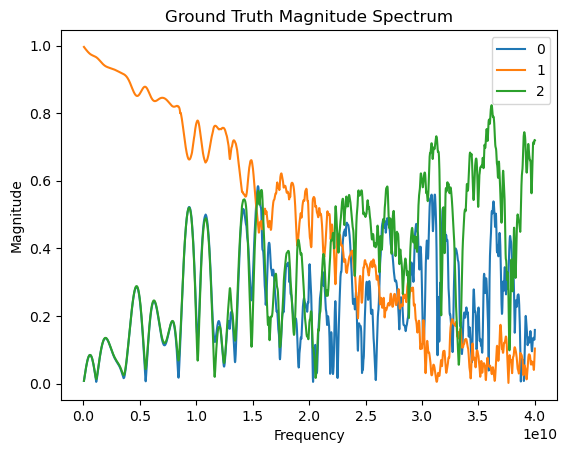

In [35]:
plt.figure()
for i in range(N_SPARAMS):
    plt.plot(gt_freqs, x_mag[0, i].cpu(), label=str(i))
if N_SPARAMS <= 10:
    plt.legend()
plt.title("Ground Truth Magnitude Spectrum")
plt.ylabel("Magnitude")
plt.xlabel("Frequency")
plt.show()

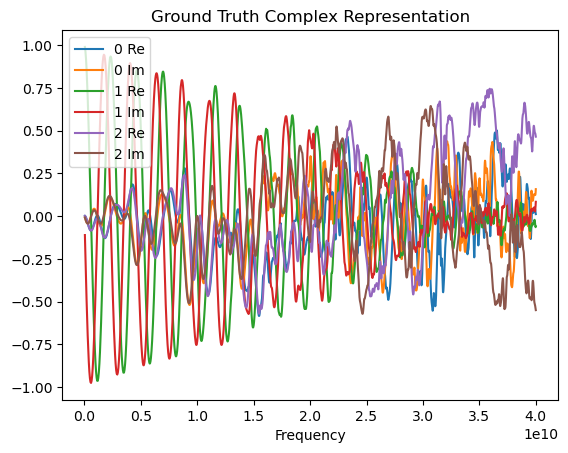

In [36]:
plt.figure()
for i in range(N_SPARAMS):
    plt.plot(gt_freqs, x[0,2*i].cpu(), label=str(i)+" Re")
    plt.plot(gt_freqs, x[0,2*i+1].cpu(), label=str(i)+" Im")
if N_SPARAMS <= 10:
    plt.legend()
plt.title("Ground Truth Complex Representation")
plt.xlabel("Frequency")
plt.show()

## Grab Some Measurements

In [37]:
PROBLEM_TYPE = "equal" #[random, equal, forecast, full, log, sqrt]
# M = int(0.10 * N_FREQS)
M = 155

kept_inds, missing_inds = utils.get_inds(PROBLEM_TYPE, N_FREQS, M)
old_kept = kept_inds.copy()

M = len(kept_inds) #re-define in case kept_inds is off by 1 or something

# remove every other point, starting at the back, don't remove first point
remove = False
for i in range(len(kept_inds) - 1, 0, -1):
    if remove:
        kept_inds = np.delete(kept_inds, [i])
        remove = False
    else:
        remove = True

print("Number of Ground Truth Frequency Points: ", N_FREQS)
print("Number of Measurements: ", M)
print("Undersampling Ratio: ", M/N_FREQS)
print(kept_inds)
print(old_kept)

Number of Ground Truth Frequency Points:  2081
Number of Measurements:  155
Undersampling Ratio:  0.07448342143200384
[   0   27   54   81  108  135  162  189  216  243  270  297  324  351
  378  405  432  459  486  513  540  567  594  621  648  675  702  729
  756  783  810  837  864  891  918  945  972  999 1026 1053 1080 1107
 1134 1161 1188 1215 1242 1269 1296 1323 1350 1377 1404 1431 1458 1485
 1512 1539 1566 1593 1620 1647 1674 1701 1728 1755 1782 1809 1836 1863
 1890 1917 1944 1971 1998 2025 2052 2080]
[   0   13   27   40   54   67   81   94  108  121  135  148  162  175
  189  202  216  229  243  256  270  283  297  310  324  337  351  364
  378  391  405  418  432  445  459  472  486  499  513  526  540  553
  567  580  594  607  621  634  648  661  675  688  702  715  729  742
  756  769  783  796  810  823  837  850  864  877  891  904  918  931
  945  958  972  985  999 1012 1026 1040 1053 1067 1080 1094 1107 1121
 1134 1148 1161 1175 1188 1202 1215 1229 1242 1256 1269 128

In [38]:
y = torch.clone(x)[:, :, kept_inds]
y_freqs = gt_freqs[kept_inds]

print("y shape: ", y.shape)
print("y_freqs shape: ", y_freqs.shape)

y shape:  torch.Size([1, 6, 78])
y_freqs shape:  (78,)


# 2. Network Setup

## Define network parameters

In [39]:
NZ = y.shape[1]

NUM_LAYERS = int(np.ceil(np.log2(N_FREQS))) - 4

if NZ < 64:
    BASE_NGF = 2 ** (int(np.ceil(np.log2(NZ))) + 1) #second power of two after NZ 
elif NZ < 128:
    BASE_NGF = 2 ** int(np.ceil(np.log2(NZ))) #next highest power of 2
else:
    BASE_NGF = NZ

NGF = [BASE_NGF] * NUM_LAYERS

BS = y.shape[0]
NC = y.shape[1]

KERNEL_SIZE = 3
USE_SKIP = False
CAUSAL_PASSIVE = True
OPTIMIZE_Z = False
USE_SGLD = False

In [40]:
print("NZ: ", str(NZ))
print("NUM_LAYERS: ", str(NUM_LAYERS))
print("BASE NGF: ", str(BASE_NGF))
print("NGF: ", str(NGF))
print("BS: ", BS)
print("NC: ", NC)
print("KERNEL_SIZE: ", KERNEL_SIZE)
print("USE_SKIP: ", USE_SKIP)
print("CAUSAL_PASSIVE: ", CAUSAL_PASSIVE)
print("OPTIMIZE_Z: ", OPTIMIZE_Z)

NZ:  6
NUM_LAYERS:  8
BASE NGF:  16
NGF:  [16, 16, 16, 16, 16, 16, 16, 16]
BS:  1
NC:  6
KERNEL_SIZE:  3
USE_SKIP:  False
CAUSAL_PASSIVE:  True
OPTIMIZE_Z:  False


## Init and check dimensions

In [41]:
from models import RES_UNET

net = RES_UNET(bs=BS,
               nz=NZ,
               ngf=NGF,
               output_size=N_FREQS,
               nc=NC,
               optimize_z=OPTIMIZE_Z,
               kernel_size=KERNEL_SIZE,
               num_layers=NUM_LAYERS,
               use_skip=USE_SKIP,
               causal_passive=CAUSAL_PASSIVE,
               p_dropout=0.0
               )
net = net.to(device)

In [42]:
test_out = net.forward_with_z()

print("Net output shape: ", test_out.shape)

Net output shape:  torch.Size([1, 6, 2081])


In [43]:
pytorch_total_params = sum(p.numel() for p in net.parameters() if p.requires_grad)

print("TOTAL PARAMS: ", pytorch_total_params)

TOTAL PARAMS:  30098


# 3. Run

## Define training parameters, losses, and track stats

In [44]:
#grab the correct file we want for VF
NUM_ACTIVE = M - len(kept_inds)

LR = 2e-4
FIRST_ITER = 20000
NUM_ITER = 2000
CURR_ITER = FIRST_ITER
TOTAL_ITERS = FIRST_ITER + NUM_ITER * NUM_ACTIVE
NUM_BURN_ITER = NUM_ITER * 0 # 0.2
SAMPLE_EVERY = 40

ACTIVE_ITER_RATIO = 0.1
SAMPLE_LAST_N = NUM_ITER * ACTIVE_ITER_RATIO

# TODO: maybe come back to this?
# TOTAL_ITER = NUM_ITER + 0.1 * NUM_ACTIVE * NUM_ITER

REG_HYPERPARAM = 1.0
NOISY_INPUT = True
USE_SGLD = False

if REG_HYPERPARAM > 0:
    regularizer = utils.Smoothing_Loss(per_param=False, reduction="sum")
    regularizer = regularizer.to(device)

optim = torch.optim.Adam(net.parameters(), lr=LR)

def get_lr(optim):
    for g in optim.param_groups:
        return g['lr']
    
def set_lr(optim, lr):
    for g in optim.param_groups:
        g['lr'] = lr
        
START_NOISE_LEVEL = CUR_NOISE_LEVEL = 1.0
END_NOISE_LEVEL = 0.001
NOISE_DECAY_FACTOR = (END_NOISE_LEVEL / START_NOISE_LEVEL)**(1 / TOTAL_ITERS) 

train_losses = []
train_errors = []
if REG_HYPERPARAM > 0:
    train_regs = []

test_mses = []
test_maes = []

is_initial_fit = True
tic = time.time()
net.train()

# (NUM_ACTIVE + 1) * NUM_OUTPUTS * S_PARAMS * FREQS
sgld_outputs_by_sample = []
# (NUM_ACTIVE + 1) * S_PARAMS * FREQS
sgld_means_by_sample = []
# (NUM_ACTIVE + 1) * S_PARAMS * FREQS
sgld_stds_by_sample = []

print("NUM ACTIVE: ", NUM_ACTIVE)

for num_actively_sampled in range(NUM_ACTIVE + 1):

    cur_sgld_outputs = torch.Tensor().to(device)   

    if not is_initial_fit:

        LENGTH_GT = len(gt_freqs)
        cn = str(CHIP_NUM) if CHIP_NUM > 9 else "0" + str(CHIP_NUM)
        fname = os.path.join(ROOT_PATH, "case"+cn)

        children = os.listdir(fname)
        children = [f for f in children if cn + ".s" in f]

        final_path = os.path.join(fname, children[0])

        fitter = VF.vectorfit.VectorFitter(final_path)
        fit1 = fitter.vector_fit("VF Result", y_freqs) 
        vf_output = fit1.fitted_network.s

        vf_data = np.stack((vf_output.real, vf_output.imag), axis=-1)
        vf_data = utils.matrix_to_sparams(vf_data)
        vf_data = torch.tensor(vf_data).view(1, -1, LENGTH_GT)
        vf_data = vf_data.to(device)

        
        # Find the maximum standard deviation point, and use it to update kept_inds
        print(sgld_outputs_by_sample)
        max_disagree_idx = find_max_variance(sgld_outputs_by_sample[-1][-1], vf_data, pickRandom=False)
        kept_inds = np.sort(np.append(kept_inds, max_disagree_idx))
        print(kept_inds)

        # Recreate the y data with the new kept_inds
        y = torch.clone(x)[:, :, kept_inds]
        y_freqs = gt_freqs[kept_inds]


    # Update the criterion to reflect the new point we have sampled
    criterion = utils.Measurement_MSE_Loss(kept_inds=kept_inds, per_param=False, reduction="sum")
    criterion = criterion.to(device)


    for i in range(int(CURR_ITER)):
        optim.zero_grad()
        
        if NOISY_INPUT:
            out = net.forward_with_z(CUR_NOISE_LEVEL)
            CUR_NOISE_LEVEL *= NOISE_DECAY_FACTOR
        else:
            out = net.forward_with_z()
        
        train_error = criterion(out, y) 
        if REG_HYPERPARAM > 0:
            train_reg = REG_HYPERPARAM * regularizer(out)
            train_loss = train_error + train_reg
        else:
            train_loss = train_error
        
        train_loss.backward()
        optim.step()

        with torch.no_grad():
            # First 20% of training will be burn-in iterations
            if (not is_initial_fit or i > NUM_BURN_ITER) and USE_SGLD:
                # Perform SGLD by adding Gaussian noise to parameters after gradient descent
                for param in net.parameters():
                    # param.add_(torch.normal(0, get_lr(optim), size=param.size()).to(device))
                    param.add_(torch.randn_like(param) * get_lr(optim) * 2)
            
            # Log the standard metrics across different numbers of samples given
            train_losses.append(train_loss.item())
            train_errors.append(train_error.item())
            if REG_HYPERPARAM > 0:
                train_regs.append(train_reg.item())
            
            test_mse = nn.MSELoss()(out, x)
            test_mses.append(test_mse.item())
            
            test_mae = nn.L1Loss()(out, x)
            test_maes.append(test_mae.item())

            if (i+1)%1000 == 0 or i == 0:
                toc = time.time()
                print("ITER ", str(i))
                print("TIME: ", str(toc - tic))
                if NOISY_INPUT:
                    print("NOISE LEVEL: ", CUR_NOISE_LEVEL)
                print()

            # Get SGLD outputs for finding mean/std
            if (NUM_ITER - i <= SAMPLE_LAST_N) and i % SAMPLE_EVERY == 0:
                cur_sgld_outputs = torch.cat([cur_sgld_outputs, out])

    sgld_outputs_by_sample.append(cur_sgld_outputs)
    sgld_means_by_sample.append(torch.mean(cur_sgld_outputs, dim=0))
    sgld_stds_by_sample.append(torch.std(cur_sgld_outputs, dim=0))

    if is_initial_fit :
    #     NUM_ITER *= ACTIVE_ITER_RATIO
        CURR_ITER = NUM_ITER
        is_initial_fit = False


    def find_max_variance(outputs, vf_outputs, pickRandom=False):
        # Outputs of shape [NUM_OUTPUTS, 20, 1000]

        # Call np.var with dim = 0 to get shape [20, 1000]
        print(vf_outputs.shape)
        print(outputs.shape)
        sqr_differences = torch.square(torch.subtract(vf_outputs[0], outputs))

        # Sum to go to [1000]
        sqr_differences = torch.mean(sqr_differences, dim=0)

        if pickRandom:
            while True:
                rand_idx = random.randint(0, len(sqr_differences) - 1)
                if rand_idx not in kept_inds:
                    print("picked: ", rand_idx)
                    return rand_idx

        _, idxs = torch.topk(sqr_differences, len(sqr_differences))

        for idx in idxs:
            if idx.item() not in kept_inds:
                return idx.item()
        return -1
    
    print("NUM_SAMPLES ", str(num_actively_sampled))
    print("TIME: ", str(toc - tic))


NUM ACTIVE:  77
ITER  0
TIME:  1.9993834495544434
NOISE LEVEL:  0.9999603010450417

ITER  999
TIME:  29.460872411727905
NOISE LEVEL:  0.9610779662376226

ITER  1999
TIME:  56.26187753677368
NOISE LEVEL:  0.9236708571874458

ITER  2999
TIME:  83.11920738220215
NOISE LEVEL:  0.8877197088986725

ITER  3999
TIME:  110.32526850700378
NOISE LEVEL:  0.8531678524173888

ITER  4999
TIME:  137.80898189544678
NOISE LEVEL:  0.8199608244606221

ITER  5999
TIME:  164.8656256198883
NOISE LEVEL:  0.788046281567139

ITER  6999
TIME:  192.01248741149902
NOISE LEVEL:  0.7573739175896664

ITER  7999
TIME:  219.44203758239746
NOISE LEVEL:  0.7278953843984988

ITER  8999
TIME:  246.63169264793396
NOISE LEVEL:  0.6995642156714612

ITER  9999
TIME:  273.84351897239685
NOISE LEVEL:  0.6723357536501458

ITER  10999
TIME:  301.15847516059875
NOISE LEVEL:  0.6461670787469219

ITER  11999
TIME:  328.40484285354614
NOISE LEVEL:  0.6210169418917959

ITER  12999
TIME:  355.8039309978485
NOISE LEVEL:  0.59684569951247

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. 
  vf.vector_fit(n_poles_cmplx=n_poles)
/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: UserWarning: The fitted network is passive, but the vector fit is not passive. Consider running `passivity_enforce()` to enforce passivity before using this model.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.17155797220766544 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
Performing fit with 2 poles.
  Fitting took 0.08336754702031612 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 0.9945360371373274 vs 1.2510016609104997)
Performing fit with 3 poles.
  Fitting took 0.0802389457821846 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.2451801956036024 vs 0.9945360371373274)
Performing fit with 4 poles.
  Fitting took 0.09063811041414738 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 3 (err 1.4452980082750837 vs 0.9945360371373274)
Performing fit with 5 poles.
  Fitting took 0.1157742403447628 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process barely converged to tolerance. It took the max. number of iterations (N_max = 100). The results might not have converged properly. 
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.1552485879510641 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 5 (err 1.3386993671787468 vs 1.0897337731939853)
Performing fit with 6 poles.
  Fitting took 0.17231694608926773 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 5 (err 0.6485292511676328 vs 1.0897337731939853)
Performing fit with 7 poles.
  Fitting took 0.2211405374109745 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 poles better than 7 (err 0.6392240558469711 vs 0.6485292511676328)
Performing fit with 8 poles.
  Fitting took 0.14069529063999653 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 8 (err 0.6678545637442115 vs 0.6392240558469711)
Performing fit with 9 poles.
  Fitting took 0.15437504276633263 seconds.
  Filling sa

/scratch/cluster/bodeng/miniconda3/envs/dip/lib/python3.9/site-packages/skrf/vectorFitting.py:869: RuntimeWarning: invalid value encountered in sqrt
  for sqrt_eigenval in np.sqrt(P_eigs):


  Fitting took 0.0925931017845869 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 2 (err 1.5695803645879292 vs 1.2609035859863293)
Performing fit with 4 poles.
  Fitting took 0.08949964120984077 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 2 (err 1.654551286610392 vs 1.2609035859863293)
Fit completed in 0.40854954719543457, using 4, resulting in a fit with 2 and error=1.2609035859863293 vs samples and error=1.2609035859863293 vs ground truth.
[tensor([[[-1.2061e-01, -1.2038e-01, -1.1991e-01,  ..., -7.4787e-02,
          -7.5771e-02, -1.0399e-01],
         [-6.3764e-05,  5.1995e-04, -4.6408e-04,  ...,  3.6423e-02,
           8.5175e-03, -2.6749e-03],
         [ 1.2085e-01,  1.2309e-01,  1.2757e-01,  ...,  1.3385e-01,
           1.2333e-01,  1.3796e-01],
         [ 3.7447e-04,  2.3172e-04, -3.0953e-03,  ..., -5.0039e-02,


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 48616648718.60684). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.17769888415932655 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.7920539093721473 vs 1.0420714900887043)
Performing fit with 7 poles.
  Fitting took 0.24726581200957298 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 6 (err 1.719629959687758 vs 1.0420714900887043)
Performing fit with 8 poles.
  Fitting took 0.15300948731601238 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 6 (err 0.7039707968324348 vs 1.0420714900887043)
Performing fit with 9 poles.
  Fitting took 0.2319138776510954 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 0.8243979973997717 vs 0.7039707968324348)
Performing fit with 10 poles.
  Fitting took 0.14821980707347393 seco

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process barely converged to tolerance. It took the max. number of iterations (N_max = 100). The results might not have converged properly. Hint: the linear system was ill-conditioned (max. condition number = 47221219431.378555). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.1790644433349371 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 5 (err 1.8346677520943353 vs 1.2969178270450465)
Performing fit with 7 poles.
  Fitting took 0.13041579350829124 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 poles better than 5 (err 1.1842378040763688 vs 1.2969178270450465)
Performing fit with 8 poles.
  Fitting took 0.17661177553236485 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 8 (err 1.2245674757319538 vs 1.1842378040763688)
Performing fit with 9 poles.
  Fitting took 3.2320587132126093 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 poles better than 8 (err 0.8303151360033608 vs 1.1842378040763688)
Performing fit with 10 poles.
  Fitting took 3.1001331098377705 seconds.
  Filling s

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 54551232445.730064). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.19898134842514992 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 5 (err 1.8357475596442345 vs 1.288579391234327)
Performing fit with 7 poles.
  Fitting took 0.4090505000203848 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 poles better than 5 (err 1.1581656529845654 vs 1.288579391234327)
Performing fit with 8 poles.
  Fitting took 4.9167788829654455 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 8 (err 1.2191697312667293 vs 1.1581656529845654)
Performing fit with 9 poles.
  Fitting took 0.23226157575845718 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 poles better than 8 (err 0.8214467029276574 vs 1.1581656529845654)
Performing fit with 10 poles.
  Fitting took 0.2714426964521408 seconds.
  Filling sam

In [45]:
# NUM_FORWARD_PASSES = 100
# sums_forward_pass_outputs = torch.Tensor(np.zeros(shape=test_out.shape, dtype=np.float32))
# sums_squared_forward_pass_outputs = torch.Tensor(np.zeros(shape=test_out.shape, dtype=np.float32))
# for i in range(NUM_FORWARD_PASSES):
#     sums_forward_pass_outputs += net.forward_with_z().cpu()
#     sums_squared_forward_pass_outputs += torch.square(net.forward_with_z()).cpu()

# mean_forward_pass_outputs = sums_forward_pass_outputs / NUM_FORWARD_PASSES
# std_forward_pass_outputs = torch.sqrt(((NUM_FORWARD_PASSES * sums_squared_forward_pass_outputs) - (sums_forward_pass_outputs * sums_forward_pass_outputs)) / (NUM_FORWARD_PASSES * (NUM_FORWARD_PASSES - 1)))

print(sgld_outputs_by_sample[0].shape)
print(sgld_means_by_sample[0].shape)
print(sgld_stds_by_sample[0].shape)

torch.Size([455, 6, 2081])
torch.Size([6, 2081])
torch.Size([6, 2081])


## Plot metrics and outputs

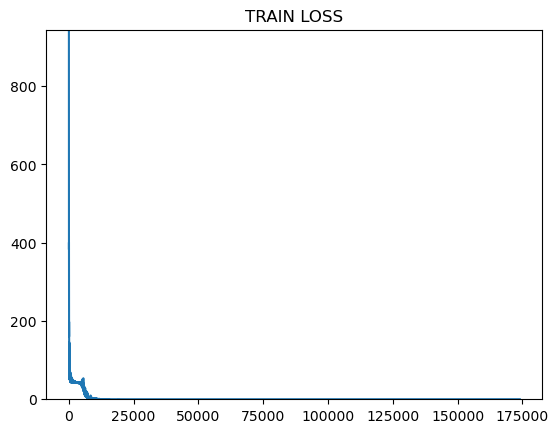

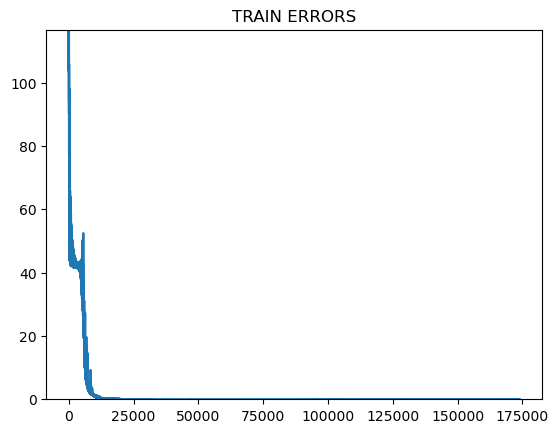

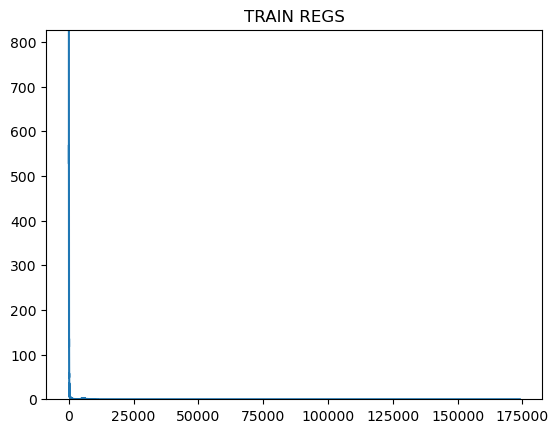

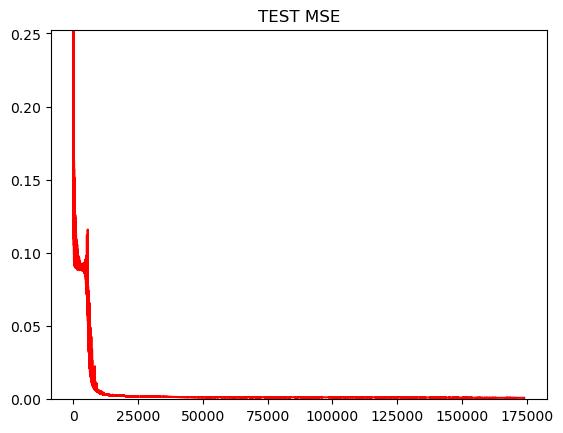

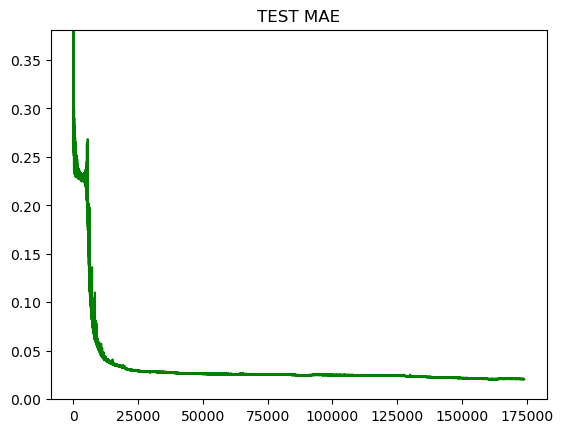

In [46]:
max_idx = 0

plt.figure()
plt.plot(train_losses)
plt.title("TRAIN LOSS")
plt.ylim(0., train_losses[max_idx])
plt.show()

plt.figure()
plt.plot(train_errors)
plt.title("TRAIN ERRORS")
plt.ylim(0., train_errors[max_idx])
plt.show()

if REG_HYPERPARAM > 0:
    plt.figure()
    plt.plot(train_regs)
    plt.title("TRAIN REGS")
    plt.ylim(0., train_regs[max_idx])
    plt.show()

plt.figure()
plt.plot(test_mses, color='r')
plt.title("TEST MSE")
plt.ylim(0., test_mses[max_idx])
plt.show()

plt.figure()
plt.plot(test_maes, color='g')
plt.title("TEST MAE")
plt.ylim(0, test_maes[max_idx])
plt.show()

In [47]:
print("Final Test MSE: ", test_mses[-1])
print("Best Test MSE: ", np.min(test_mses))
print("Best Test MSE Iteration: ", np.argmin(test_mses))

Final Test MSE:  0.0009865241590887308
Best Test MSE:  0.0009702926035970449
Best Test MSE Iteration:  160418


In [48]:
LENGTH = len(gt_freqs)

cn = str(CHIP_NUM) if CHIP_NUM > 9 else "0" + str(CHIP_NUM)
fname = os.path.join(ROOT_PATH, "case"+cn)

children = os.listdir(fname)
children = [f for f in children if cn + ".s" in f]

final_path = os.path.join(fname, children[0])

print(final_path)

fitter = VF.vectorfit.VectorFitter(final_path)
print(y_freqs)
fit1 = fitter.vector_fit("VF Result", y_freqs) 
vf_output = fit1.fitted_network.s
print(vf_output.shape)
print(vf_output.dtype)
vf_data = np.stack((vf_output.real, vf_output.imag), axis=-1)
vf_data = utils.matrix_to_sparams(vf_data)
vf_data = torch.tensor(vf_data).view(1, -1, LENGTH)
vf_data = vf_data.to(device)
print(vf_data.shape)

/scratch/cluster/bodeng/UTAFSDataNew/new_data/case23/case23.s2p
[4.0000e+07 8.9500e+07 7.3300e+08 1.0300e+09 1.3765e+09 2.0200e+09
 2.1190e+09 2.3665e+09 2.5645e+09 2.7130e+09 2.8615e+09 2.9605e+09
 3.0100e+09 3.5050e+09 3.8515e+09 4.0000e+09 4.0180e+09 4.0720e+09
 4.1260e+09 4.2160e+09 4.2880e+09 4.3600e+09 4.5040e+09 4.6660e+09
 4.7740e+09 4.9900e+09 5.0800e+09 5.1520e+09 5.1880e+09 5.2240e+09
 5.2420e+09 5.2780e+09 5.2960e+09 5.3500e+09 5.3860e+09 5.4220e+09
 5.4760e+09 5.9620e+09 6.0520e+09 6.1600e+09 6.2500e+09 6.2680e+09
 6.2860e+09 6.3040e+09 6.3220e+09 6.4480e+09 6.5380e+09 6.9340e+09
 7.0420e+09 7.1860e+09 7.3480e+09 7.4200e+09 7.9060e+09 8.0860e+09
 8.3920e+09 8.5540e+09 8.8780e+09 9.3280e+09 9.3640e+09 9.8500e+09
 1.0084e+10 1.0336e+10 1.0822e+10 1.1002e+10 1.1308e+10 1.1506e+10
 1.1794e+10 1.2046e+10 1.2280e+10 1.2766e+10 1.3252e+10 1.3738e+10
 1.3792e+10 1.3864e+10 1.4224e+10 1.4710e+10 1.5196e+10 1.5268e+10
 1.5340e+10 1.5412e+10 1.5682e+10 1.6168e+10 1.6186e+10 1.6654e+1

In [49]:
## Make neworks from DIP, Interp, and Observations
DIP_OUT_MATRIX = utils.sparams_to_matrix(out)
VF_MATRIX = utils.sparams_to_matrix(vf_data)
Y_MATRIX = utils.sparams_to_matrix(y)

print(DIP_OUT_MATRIX.shape)
print(VF_MATRIX.shape)
print(Y_MATRIX.shape)

DIP_net = utils.matrix_to_network(DIP_OUT_MATRIX, gt_freqs, "DIP Recon With "+str(M)+" Samples for Chip "+str(CHIP_NUM))
VF_net = utils.matrix_to_network(VF_MATRIX, gt_freqs, "Vector Fit With "+str(M)+" Samples for Chip "+str(CHIP_NUM))
Y_net = utils.matrix_to_network(Y_MATRIX, y_freqs, "Observations for Chip "+str(CHIP_NUM))

DIP_FINAL_OUT = np.stack((DIP_net.s.real, DIP_net.s.imag), axis=-1)
VF_FINAL_OUT = np.stack((VF_net.s.real, VF_net.s.imag), axis=-1)

print(DIP_FINAL_OUT.shape)
print(VF_FINAL_OUT.shape)

dip_data = utils.matrix_to_sparams(DIP_FINAL_OUT)
vf_data_mat = utils.matrix_to_sparams(VF_FINAL_OUT)

print(dip_data.shape)
print(vf_data_mat.shape)
print(dip_data.dtype)
print(vf_data_mat.dtype)

## Compare DIP, VF, and Interp
import skimage.metrics
from skimage.metrics import peak_signal_noise_ratio as psnr

psnr_ours = psnr(gt_data, dip_data)
psnr_vf = psnr(gt_data, vf_data_mat)
print("DIP PSNR:      ", psnr_ours)
print("VF PSNR:       ", psnr_vf)

print("Final DIP MSE: ", test_mses[-1])
print("VF MSE:        ", nn.MSELoss()(vf_data, x).item())
print("Mean DIP MSE: ", nn.MSELoss()(sgld_means_by_sample[-1][np.newaxis], x).item())

torch.Size([2081, 2, 2, 2])
torch.Size([2081, 2, 2, 2])
torch.Size([155, 2, 2, 2])
(2081, 2, 2, 2)
(2081, 2, 2, 2)
(3, 2, 2081)
(3, 2, 2081)
float32
float32
DIP PSNR:       36.079522487982615
VF PSNR:        18.937939176177444
Final DIP MSE:  0.0009865241590887308
VF MSE:         0.051081787794828415
Mean DIP MSE:  0.0009891935624182224


(2081,)
torch.Size([6, 2081])
torch.Size([1, 6, 2081])
torch.Size([1, 6, 155])
torch.Size([1, 6, 2081])
torch.Size([1, 6, 2081])


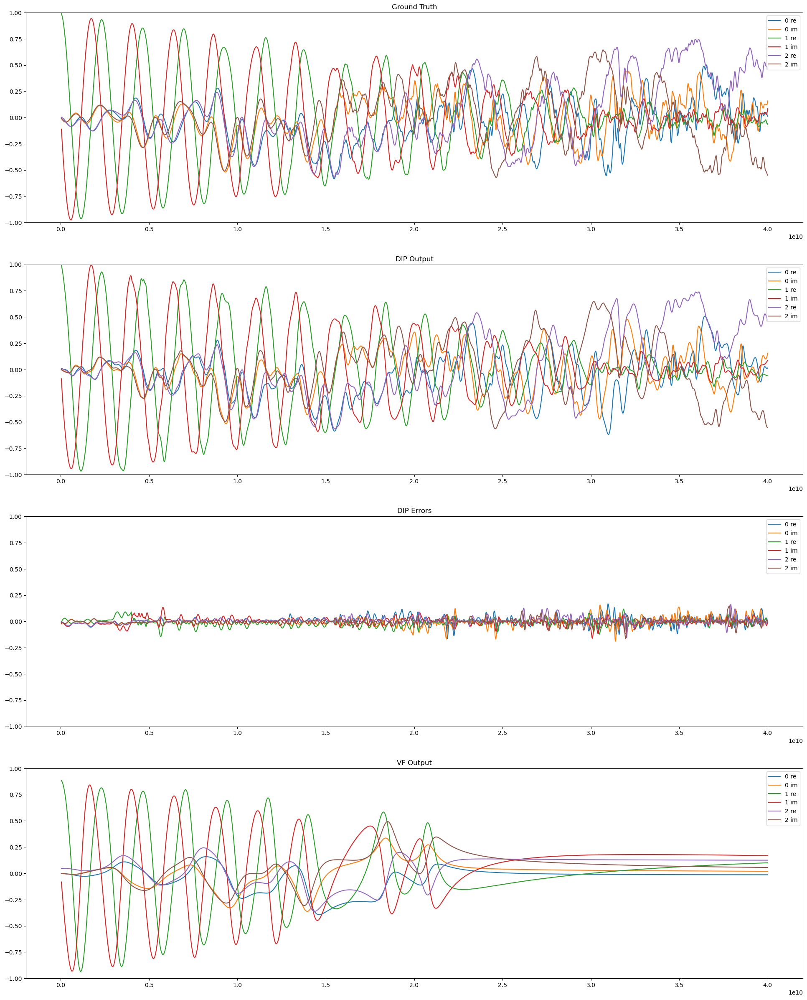

In [50]:
dip_errors = x.detach().cpu() - sgld_means_by_sample[-1].detach().cpu()
print(gt_freqs.shape)
print(sgld_means_by_sample[-1].shape)
print(dip_errors.shape)
print(y.shape)

print(out.shape)
print(vf_data.shape)

fig, axes = plt.subplots(4,1, figsize=(24, 30))
axes = axes.flatten()

for i in range(N_SPARAMS):
    axes[0].plot(gt_freqs, x[0,2*i].cpu(), label=str(i)+" re")
    axes[0].plot(gt_freqs, x[0,2*i+1].cpu(), label=str(i)+" im")
axes[0].set_title("Ground Truth")
axes[0].set_ylim(-1,1)
if N_SPARAMS <= 10:
    axes[0].legend(loc='upper right')

# SHOW WITH MEAN AND STD DEVS
# for i in range(N_SPARAMS):

#     axes[1].plot(gt_freqs, sgld_means_by_sample[-1][2*i].detach().cpu(), label=str(i)+" re")
#     axes[1].plot(gt_freqs, sgld_means_by_sample[-1][2*i+1].detach().cpu(), label=str(i)+" im")
#     axes[1].fill_between(gt_freqs, sgld_means_by_sample[-1][2*i].detach().cpu() - 2 * sgld_stds_by_sample[-1][2*i].detach().cpu(), sgld_means_by_sample[-1][2*i].detach().cpu() + 2 * sgld_stds_by_sample[-1][2*i].detach().cpu())
#     axes[1].fill_between(gt_freqs, sgld_means_by_sample[-1][2*i+1].detach().cpu() - 2 * sgld_stds_by_sample[-1][2*i+1].detach().cpu(), sgld_means_by_sample[-1][2*i+1].detach().cpu() + 2 * sgld_stds_by_sample[-1][2*i+1].detach().cpu())

#     # axes[1].scatter(gt_freqs[kept_inds], y[0,2*i].cpu(), color='black')
#     # axes[1].scatter(gt_freqs[kept_inds], y[0,2*i+1].cpu(), color='black')


# axes[1].set_title("DIP Output")
# axes[1].set_ylim(-1,1)
# if N_SPARAMS <= 10:
#     axes[1].legend(loc='upper right')

for i in range(N_SPARAMS):
    axes[1].plot(gt_freqs, out[0,2*i].detach().cpu(), label=str(i)+" re")
    axes[1].plot(gt_freqs, out[0,2*i+1].detach().cpu(), label=str(i)+" im")
axes[1].set_title("DIP Output")
axes[1].set_ylim(-1,1)
if N_SPARAMS <= 10:
    axes[1].legend(loc='upper right')

for i in range(N_SPARAMS):
    axes[2].plot(gt_freqs, dip_errors[0,2*i].detach().cpu(), label=str(i)+" re")
    axes[2].plot(gt_freqs, dip_errors[0,2*i+1].detach().cpu(), label=str(i)+" im")
axes[2].set_title("DIP Errors")
axes[2].set_ylim(-1,1)
if N_SPARAMS <= 10:
    axes[2].legend(loc='upper right')

for i in range(N_SPARAMS):
    axes[3].plot(gt_freqs, vf_data[0,2*i].detach().cpu(), label=str(i)+" re")
    axes[3].plot(gt_freqs, vf_data[0,2*i+1].detach().cpu(), label=str(i)+" im")
axes[3].set_title("VF Output")
axes[3].set_ylim(-1,1)
if N_SPARAMS <= 10:
    axes[3].legend(loc='upper right')

In [51]:
torch.set_printoptions(threshold=100000)
print(sgld_stds_by_sample[-1])

tensor([[1.8900e-03, 1.9048e-03, 1.8533e-03, 1.3456e-03, 1.1590e-03, 9.5145e-04,
         7.1990e-04, 8.7515e-04, 7.9454e-04, 3.9639e-04, 3.9533e-04, 4.9849e-04,
         6.1619e-04, 4.8336e-04, 5.1700e-04, 5.5816e-04, 5.5893e-04, 6.1094e-04,
         5.8911e-04, 5.8186e-04, 5.7607e-04, 7.5659e-04, 7.7854e-04, 1.0620e-03,
         1.0952e-03, 8.7790e-04, 8.6194e-04, 5.4061e-04, 5.2235e-04, 4.4689e-04,
         3.4338e-04, 4.2866e-04, 3.0780e-04, 5.0624e-04, 3.7328e-04, 3.7459e-04,
         4.7021e-04, 1.5540e-03, 1.5884e-03, 1.0974e-03, 1.1433e-03, 1.2776e-03,
         1.5120e-03, 1.6349e-03, 1.6311e-03, 1.7345e-03, 1.7895e-03, 1.6764e-03,
         1.5862e-03, 1.5322e-03, 1.5067e-03, 1.3257e-03, 9.9342e-04, 7.0135e-04,
         4.5322e-04, 3.1803e-04, 2.8743e-04, 2.0270e-04, 2.5713e-04, 2.3235e-04,
         2.7301e-04, 3.2635e-04, 3.0941e-04, 3.3673e-04, 4.2612e-04, 4.3099e-04,
         3.4053e-04, 5.8357e-04, 5.0519e-04, 4.0483e-04, 3.3693e-04, 4.3372e-04,
         4.4805e-04, 4.6383e

In [52]:
print(dip_errors[-1])

tensor([[-5.2317e-03, -5.8404e-03, -9.6473e-03, -1.8601e-02, -2.7915e-02,
         -3.6726e-02, -4.4146e-02, -4.9314e-02, -5.0107e-02, -4.7104e-02,
         -4.0831e-02, -3.3338e-02, -2.4551e-02, -1.7343e-02, -1.5067e-02,
         -1.5169e-02, -1.8351e-02, -1.9976e-02, -1.8907e-02, -1.7013e-02,
         -1.5091e-02, -1.6975e-02, -2.0613e-02, -2.3261e-02, -2.3150e-02,
         -2.0511e-02, -1.6495e-02, -1.3972e-02, -1.6066e-02, -2.2375e-02,
         -3.2047e-02, -4.1921e-02, -4.9681e-02, -5.4583e-02, -5.4694e-02,
         -5.0833e-02, -4.2769e-02, -3.2619e-02, -2.1941e-02, -1.3849e-02,
         -9.8012e-03, -8.8151e-03, -1.1446e-02, -1.4420e-02, -1.8333e-02,
         -1.9649e-02, -1.8532e-02, -1.6402e-02, -1.6860e-02, -1.6469e-02,
         -1.5398e-02, -1.4812e-02, -1.4735e-02, -1.4222e-02, -1.3208e-02,
         -1.2565e-02, -1.2196e-02, -9.5915e-03, -7.5955e-03, -4.6158e-03,
          4.7828e-04,  1.4617e-03, -3.5202e-03, -1.1735e-02, -2.2910e-02,
         -3.1951e-02, -3.8461e-02, -3.

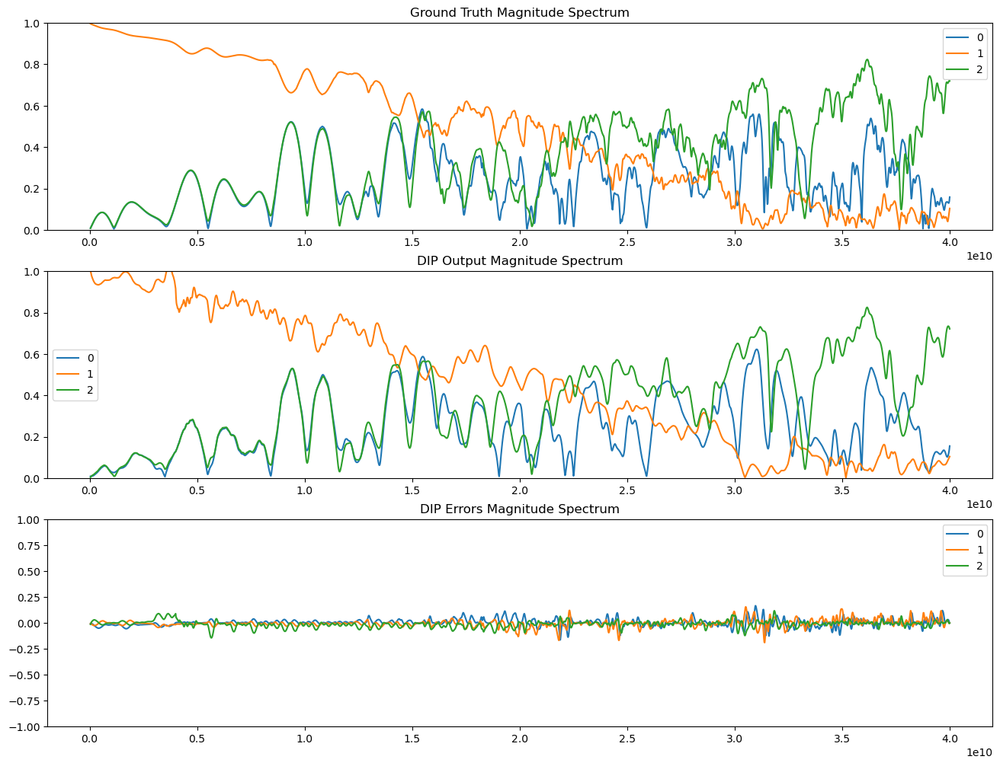

In [53]:
out_mag = utils.sparams_to_mag(out)
dip_errors_mag = x_mag - out_mag 

fig, axes = plt.subplots(3,1, figsize=(16, 12))
axes = axes.flatten()

for i in range(N_SPARAMS):
    axes[0].plot(gt_freqs, x_mag[0,i].cpu(), label=str(i))
axes[0].set_title("Ground Truth Magnitude Spectrum")
axes[0].set_ylim(0,1)
if N_SPARAMS <= 10:
    axes[0].legend()

for i in range(N_SPARAMS):
    axes[1].plot(gt_freqs, out_mag[0,i].detach().cpu(), label=str(i))
axes[1].set_title("DIP Output Magnitude Spectrum")
axes[1].set_ylim(0,1)
if N_SPARAMS <= 10:
    axes[1].legend()
    
for i in range(N_SPARAMS):
    axes[2].plot(gt_freqs, dip_errors[0,i].detach().cpu(), label=str(i))
axes[2].set_title("DIP Errors Magnitude Spectrum")
axes[2].set_ylim(-1,1)
if N_SPARAMS <= 10:
    axes[2].legend()

In [54]:
print(kept_inds)

[   0    1   14   20   27   40   42   47   51   54   57   59   60   70
   77   80   81   84   87   92   96  100  108  117  123  135  140  144
  146  148  149  151  152  155  157  159  162  189  194  200  205  206
  207  208  209  216  221  243  249  257  266  270  297  307  324  333
  351  376  378  405  418  432  459  469  486  497  513  527  540  567
  594  621  624  628  648  675  702  706  710  714  729  756  757  783
  810  837  864  891  918  945  972  975  999 1026 1035 1053 1080 1107
 1115 1122 1134 1161 1188 1207 1215 1242 1253 1257 1269 1296 1323 1350
 1377 1404 1431 1458 1471 1485 1512 1539 1566 1593 1608 1620 1647 1674
 1701 1728 1755 1766 1771 1782 1792 1809 1836 1847 1854 1863 1873 1877
 1890 1912 1917 1925 1938 1944 1946 1971 1988 1998 2005 2025 2052 2069
 2080]
